In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import numpy as np
import re
import nltk
import matplotlib.pyplot as plt
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

pd.options.display.max_colwidth = 200
%matplotlib inline


In [3]:
df = pd.read_csv('./data/train_preprocess.csv')

df.head()


,sentence,fuel,machine,others,part,price,service
0,Saya memakai Honda Jazz GK5 tahun 2014 ( pertama meluncur ) . Mobil nya bagus dan enak sesuai moto nya menyenangkan untuk dikendarai,neutral,neutral,positive,neutral,neutral,neutral
1,Avanza kenapa jadi boros bensin begini dah ah. Baru diisi sudah mau setengah saja .,negative,neutral,neutral,neutral,neutral,neutral
2,"saran ku dan pengalaman ku , mending beli mobil niaga L300 atau canter . irit dan bandel .",positive,positive,neutral,neutral,neutral,neutral
3,Dari segi harga juga pajero lebih mahal 30 jutaan dibanding fortuner,neutral,neutral,neutral,neutral,positive,neutral
4,Kalo menurut gw enak pajero si,neutral,neutral,positive,neutral,neutral,neutral


In [4]:

stemmer = StemmerFactory().create_stemmer()
wpt = nltk.WordPunctTokenizer()
stopword_factory = StopWordRemoverFactory()



def uncapitalize(doc):
    return doc.lower()


def normalize_document(doc):
    doc = uncapitalize(doc)
    doc = doc.strip()
    doc = wpt.tokenize(doc)
    doc = [stemmer.stem(word) for word in doc]
    doc = " ".join(doc)
    return doc





normalize_corpus = np.vectorize(normalize_document)

In [5]:
norm_corpus = normalize_corpus(list(df['sentence'])) 

# save to csv
df['clean_sentence'] = norm_corpus
df.to_csv('train_preprocess_stemmed.csv', index=False)
df.head()


,sentence,fuel,machine,others,part,price,service,clean_sentence
0,Saya memakai Honda Jazz GK5 tahun 2014 ( pertama meluncur ) . Mobil nya bagus dan enak sesuai moto nya menyenangkan untuk dikendarai,neutral,neutral,positive,neutral,neutral,neutral,saya pakai honda jazz gk5 tahun 2014 pertama luncur mobil nya bagus dan enak sesuai moto nya senang untuk kendara
1,Avanza kenapa jadi boros bensin begini dah ah. Baru diisi sudah mau setengah saja .,negative,neutral,neutral,neutral,neutral,neutral,avanza kenapa jadi boros bensin begini dah ah baru isi sudah mau tengah saja
2,"saran ku dan pengalaman ku , mending beli mobil niaga L300 atau canter . irit dan bandel .",positive,positive,neutral,neutral,neutral,neutral,saran ku dan alam ku mending beli mobil niaga l300 atau canter irit dan bandel
3,Dari segi harga juga pajero lebih mahal 30 jutaan dibanding fortuner,neutral,neutral,neutral,neutral,positive,neutral,dari segi harga juga pajero lebih mahal 30 juta banding fortuner
4,Kalo menurut gw enak pajero si,neutral,neutral,positive,neutral,neutral,neutral,kalo turut gw enak pajero si


In [6]:
df['clean_sentence'] = norm_corpus

df.head()

,sentence,fuel,machine,others,part,price,service,clean_sentence
0,Saya memakai Honda Jazz GK5 tahun 2014 ( pertama meluncur ) . Mobil nya bagus dan enak sesuai moto nya menyenangkan untuk dikendarai,neutral,neutral,positive,neutral,neutral,neutral,saya pakai honda jazz gk5 tahun 2014 pertama luncur mobil nya bagus dan enak sesuai moto nya senang untuk kendara
1,Avanza kenapa jadi boros bensin begini dah ah. Baru diisi sudah mau setengah saja .,negative,neutral,neutral,neutral,neutral,neutral,avanza kenapa jadi boros bensin begini dah ah baru isi sudah mau tengah saja
2,"saran ku dan pengalaman ku , mending beli mobil niaga L300 atau canter . irit dan bandel .",positive,positive,neutral,neutral,neutral,neutral,saran ku dan alam ku mending beli mobil niaga l300 atau canter irit dan bandel
3,Dari segi harga juga pajero lebih mahal 30 jutaan dibanding fortuner,neutral,neutral,neutral,neutral,positive,neutral,dari segi harga juga pajero lebih mahal 30 juta banding fortuner
4,Kalo menurut gw enak pajero si,neutral,neutral,positive,neutral,neutral,neutral,kalo turut gw enak pajero si


<h1>Bag Of Words Model</h1>

In [7]:
from sklearn.feature_extraction.text import CountVectorizer


cv = CountVectorizer(min_df=0., max_df=1.)
cv_matrix = cv.fit_transform(df['clean_sentence'])
cv_matrix

<810x1594 sparse matrix of type '<class 'numpy.int64'>'
	with 10168 stored elements in Compressed Sparse Row format>

In [8]:
print(cv_matrix)


  (0, 1253)	1
  (0, 1074)	1
  (0, 581)	1
  (0, 647)	1
  (0, 518)	1
  (0, 1399)	1
  (0, 44)	1
  (0, 1122)	1
  (0, 865)	1
  (0, 953)	1
  (0, 1037)	2
  (0, 184)	1
  (0, 371)	1
  (0, 447)	1
  (0, 1310)	1
  (0, 967)	1
  (0, 1293)	1
  (0, 1524)	1
  (0, 740)	1
  (1, 165)	1
  (1, 735)	1
  (1, 624)	1
  (1, 279)	1
  (1, 239)	1
  (1, 227)	1
  :	:
  (808, 1586)	1
  (808, 394)	1
  (808, 370)	1
  (808, 1240)	1
  (808, 1039)	1
  (808, 557)	2
  (808, 633)	1
  (808, 187)	1
  (808, 192)	1
  (808, 1536)	1
  (808, 535)	1
  (808, 912)	1
  (808, 802)	1
  (808, 510)	1
  (809, 374)	1
  (809, 556)	1
  (809, 1586)	1
  (809, 354)	1
  (809, 388)	1
  (809, 439)	1
  (809, 309)	1
  (809, 906)	1
  (809, 442)	1
  (809, 270)	1
  (809, 1371)	1


In [9]:
cv_matrix = cv_matrix.toarray()
cv_matrix


array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [10]:
vocab = cv.get_feature_names_out()
pd.DataFrame(cv_matrix, columns=vocab)

,000,0001,04,08,10,100,1000,11,118,12,...,yamahaid,yamahaindonesia,yang,yangg,yaudah,yg,ymh,yogyakarta,zaman,zr
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
806,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
807,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
808,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


<h1>Bag of N-Grams Model</h1>

In [11]:
bv = CountVectorizer(ngram_range=(2,2))
bv_matrix = bv.fit_transform(df['clean_sentence'])

bv_matrix = bv_matrix.toarray()
vocab = bv.get_feature_names_out()
pd.DataFrame(bv_matrix, columns=vocab)

,000 rupiah,000 sumpah,0001 ga,04 2008,08 family,10 juta,10 menit,10 tahun,10 udah,10 woi,...,yg kes,yg lebih,yg menang,yg paling,yg rush,yg sangat,ymh awat,yogyakarta dan,zaman nya,zr bukan
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
806,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
807,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
808,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


<h1>TF-IDF Model</h1>

In [12]:
from sklearn.feature_extraction.text import TfidfTransformer

tt = TfidfTransformer(norm='l2', use_idf=True, smooth_idf=True)
tt_matrix = tt.fit_transform(cv_matrix)

tt_matrix = tt_matrix.toarray()
vocab = cv.get_feature_names_out()
pd.DataFrame(np.round(tt_matrix, 2), columns=vocab)

,000,0001,04,08,10,100,1000,11,118,12,...,yamahaid,yamahaindonesia,yang,yangg,yaudah,yg,ymh,yogyakarta,zaman,zr
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
806,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0
807,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
808,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.11,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [13]:
from sklearn.feature_extraction.text import TfidfVectorizer

tv = TfidfVectorizer(min_df=0., max_df=1., norm='l2', use_idf=True, smooth_idf=True)
tv_matrix = tv.fit_transform(df['clean_sentence'])
tv_matrix = tv_matrix.toarray()

vocab = tv.get_feature_names_out()
pd.DataFrame(np.round(tv_matrix, 2), columns=vocab)

,000,0001,04,08,10,100,1000,11,118,12,...,yamahaid,yamahaindonesia,yang,yangg,yaudah,yg,ymh,yogyakarta,zaman,zr
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
806,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.17,0.0,0.0,0.0,0.0,0.0,0.0,0.0
807,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0
808,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.11,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<h1>Understanding the TF-IDF from Scratch</h1>

In [14]:
unique_words = list(
    set([word for doc in [doc.split() for doc in df['clean_sentence']] for word in doc])
)

# Create dictionary with unique words as keys, initialized to 0
def_feature_dict = {w: 0 for w in unique_words}
print(def_feature_dict)


{'an': 0, 'ngapain': 0, 'siang': 0, 'off': 0, 'ac': 0, 'gari': 0, 'dikerjain': 0, 'nunggu': 0, 'xi': 0, 'bakal': 0, 'nahan': 0, 'tangguh': 0, 'dapet': 0, 'time': 0, 'di': 0, 'pilih': 0, 'indonesia': 0, 'daya': 0, 'alokasi': 0, 'sistem': 0, 'sonic': 0, 'ingat': 0, 'aki': 0, 'jepang': 0, 'toolkits': 0, 'ramadhan': 0, 'apa': 0, 'sporty': 0, '90': 0, 'rusak': 0, 'allah': 0, 'tanjak': 0, 'angkut': 0, 'family': 0, 'muka': 0, 'ngaco': 0, 'series': 0, 'kretek': 0, 'bro': 0, 'max': 0, 'mainin': 0, 'monitor': 0, 'unggul': 0, 'setia': 0, 'cuma': 0, 'pt': 0, '135': 0, 'eksterior': 0, 'gk5': 0, 'gitu': 0, 'dlx': 0, 'jeroan': 0, 'gado2': 0, 'halus': 0, 'auto': 0, 'vvti': 0, 'tipissss': 0, 'balap': 0, 'confero': 0, 'suku': 0, 'fi': 0, 'seperti': 0, 'sempit': 0, 'keren': 0, 'mantep': 0, 'prefer': 0, 'yang': 0, '2000': 0, '2007': 0, 'mana': 0, 'jamin': 0, '3': 0, 'exceed': 0, 'vrz': 0, 'orang': 0, 'mas': 0, 'kecuali': 0, 'ahass': 0, 'bahan': 0, 'sekarang': 0, 'ch': 0, 'waktu': 0, 'great': 0, 'spirit': 

In [15]:
from collections import Counter

bow_features = []

for doc in df['clean_sentence']:
    bow_feature = Counter(doc.split())
    all_features = Counter(def_feature_dict)
    bow_feature.update(all_features)
    bow_features.append(bow_feature)
    
bow_features = pd.DataFrame(bow_features)
bow_features

,saya,pakai,honda,jazz,gk5,tahun,2014,pertama,luncur,mobil,...,tadi,ada,gk,isuzu,doang,kelapa,rigid,hadir,boleh,hatta
0,1,1,1,1,1,1,1,1,1,1,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
806,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
807,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
808,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [16]:
import scipy.sparse as sp
feature_names = list(bow_features.columns)

df_bow = np.diff(sp.csc_matrix(bow_features, dtype=int).indptr)
df_bow = 1 + df_bow

# show smoothened version of document frequencies
pd.DataFrame([df_bow], columns=feature_names)

,saya,pakai,honda,jazz,gk5,tahun,2014,pertama,luncur,mobil,...,tadi,ada,gk,isuzu,doang,kelapa,rigid,hadir,boleh,hatta
0,156,94,93,15,2,48,4,8,2,157,...,3,40,2,2,6,2,3,2,2,2


In [17]:
#compute inverse document frequency
total_docs = 1 + len(df['clean_sentence'])
print(total_docs)

total_docs_float = float(total_docs)

idf = 1.0 + np.log(float(total_docs_float)/ df_bow)

print(idf)
# show smoothened version of idf
pd.DataFrame([np.round(idf, 2)], columns=feature_names)




811
[2.64841205 3.15497327 3.16566856 ... 7.00512087 7.00512087 7.00512087]


,saya,pakai,honda,jazz,gk5,tahun,2014,pertama,luncur,mobil,...,tadi,ada,gk,isuzu,doang,kelapa,rigid,hadir,boleh,hatta
0,2.65,3.15,3.17,4.99,7.01,3.83,6.31,5.62,7.01,2.64,...,6.6,4.01,7.01,7.01,5.91,7.01,6.6,7.01,7.01,7.01


In [18]:
# compute idf diagonal matrix
total_features = bow_features.shape[1]
idf_diag = sp.spdiags(idf, diags=0, m=total_features, n=total_features)
idf_dense = idf_diag.todense()

#print the idf diagonal matrix
pd.DataFrame(np.round(idf_dense, 2))

,0,1,2,3,4,5,6,7,8,9,...,1606,1607,1608,1609,1610,1611,1612,1613,1614,1615
0,2.65,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.00
1,0.00,3.15,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.00
2,0.00,0.00,3.17,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.00
3,0.00,0.00,0.00,4.99,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.00
4,0.00,0.00,0.00,0.00,7.01,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1611,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,7.01,0.0,0.00,0.00,0.00
1612,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,6.6,0.00,0.00,0.00
1613,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,7.01,0.00,0.00
1614,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,7.01,0.00


In [19]:
# compute tfidf feature matrix
tf = np.array(bow_features, dtype='float64')
tfidf = tf * idf
#view raw tfidf feature matrix
pd.DataFrame(np.round(tfidf, 2), columns=feature_names)

,saya,pakai,honda,jazz,gk5,tahun,2014,pertama,luncur,mobil,...,tadi,ada,gk,isuzu,doang,kelapa,rigid,hadir,boleh,hatta
0,2.65,3.15,3.17,4.99,7.01,3.83,6.31,5.62,7.01,2.64,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,2.64,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
806,0.00,3.15,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
807,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
808,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [20]:
from numpy.linalg import norm
# compute L2 norms
norms = norm(tfidf, axis=1)

#print norms for each document
print (np.round(norms, 3))

[20.969 19.118 21.057 14.34  11.618 18.964 20.565 11.572 19.419 21.364
 26.621 18.067 13.503 18.14  30.556 12.953 18.848 28.525 21.836 13.219
 16.514 19.164 20.207 12.98  18.768 15.121  8.781 13.233  8.179 22.729
 11.378 19.484 15.664 16.836  9.28  10.675 19.633 27.856 16.492 16.562
 21.318 13.371 16.57  14.321 18.249 23.967 18.977 11.987 23.164 14.627
 14.705 23.864 32.397 26.865 18.364 20.566 22.837 20.29  21.112 10.294
 20.349 24.678 20.935 21.868 27.035 35.098 20.092 15.979 13.841 24.721
 20.445 11.795 14.406  8.991 19.235 17.952 22.386 24.192 18.006 23.432
 12.515 23.983 17.673 17.452 12.232 22.733 13.472 12.473  8.324 24.727
 17.65  16.716 21.725 11.65  20.243 20.054 12.83  11.736 17.166 15.728
 31.879 13.675 23.951 26.691 19.217 23.031 17.243 14.401 17.159 25.973
 10.828 14.343 29.245 19.054 25.307 20.933 12.401 18.232 12.784 10.878
 15.497 16.533 12.488 13.516 16.593 31.376 16.446 10.623 15.231 20.289
 25.42  14.029  8.02  11.73  12.206 20.719 20.916 13.375 20.59  14.198
 21.24

In [21]:
norm_tfidf = tfidf / norms[:, None]

# show final tfidf feature matrix
pd.DataFrame(np.round(norm_tfidf, 2), columns=feature_names)

,saya,pakai,honda,jazz,gk5,tahun,2014,pertama,luncur,mobil,...,tadi,ada,gk,isuzu,doang,kelapa,rigid,hadir,boleh,hatta
0,0.13,0.15,0.15,0.24,0.33,0.18,0.3,0.27,0.33,0.13,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.13,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
805,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
806,0.00,0.22,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
807,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
808,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [22]:
new_df = pd.read_csv('./data/test_preprocess.csv')

new_df.head()


,sentence,fuel,machine,others,part,price,service
0,Terios paling gagah . Apalagi warna merah metalic !,neutral,neutral,positive,positive,neutral,neutral
1,"gue pakai mobilio . menurut gue , bener fun to drive , enak dipakai nya .",neutral,neutral,positive,neutral,neutral,neutral
2,ya walaupun memiliki desain sporty kalau tingkat kenyamanan mobil berkurang juga berkurang kan,neutral,neutral,negative,positive,neutral,neutral
3,Xpander laku keras di pasar Indonesia .,neutral,neutral,positive,neutral,neutral,neutral
4,"Kalau mau segala enak pakai Avanza saja , mas .",neutral,neutral,positive,neutral,neutral,neutral


In [23]:
norm_corpus = normalize_corpus(list(new_df['sentence']))

new_df['clean_sentence'] = norm_corpus

new_df.head()

,sentence,fuel,machine,others,part,price,service,clean_sentence
0,Terios paling gagah . Apalagi warna merah metalic !,neutral,neutral,positive,positive,neutral,neutral,terios paling gagah apalagi warna merah metalic
1,"gue pakai mobilio . menurut gue , bener fun to drive , enak dipakai nya .",neutral,neutral,positive,neutral,neutral,neutral,gue pakai mobilio turut gue bener fun to drive enak pakai nya
2,ya walaupun memiliki desain sporty kalau tingkat kenyamanan mobil berkurang juga berkurang kan,neutral,neutral,negative,positive,neutral,neutral,ya walaupun milik desain sporty kalau tingkat nyaman mobil kurang juga kurang kan
3,Xpander laku keras di pasar Indonesia .,neutral,neutral,positive,neutral,neutral,neutral,xpander laku keras di pasar indonesia
4,"Kalau mau segala enak pakai Avanza saja , mas .",neutral,neutral,positive,neutral,neutral,neutral,kalau mau segala enak pakai avanza saja mas


In [24]:
pd.DataFrame(np.round(tv.transform(new_df['clean_sentence']).toarray(), 2), columns=tv.get_feature_names_out())

,000,0001,04,08,10,100,1000,11,118,12,...,yamahaid,yamahaindonesia,yang,yangg,yaudah,yg,ymh,yogyakarta,zaman,zr
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
176,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
177,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
178,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<h1>ADVANCE</h1>

<h1>Implementing a word2vec model using a CBOW (Continuous Bag of Words) neural network architecture</h1>

In [26]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
import numpy as np

# Create and configure tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(df['clean_sentence'])
word2id = tokenizer.word_index

# Add padding token
word2id['PAD'] = 0
id2word = {v:k for k, v in word2id.items()}

# Convert texts to sequences using tokenization
wids = []
for text in df['clean_sentence']:
    # Using our tokenizer to keep consistency with the rest of the notebook
    tokens = wpt.tokenize(text)
    # Filter out any tokens that aren't in our vocabulary
    tokens = [w for w in tokens if w in word2id]
    wids.append([word2id[w] for w in tokens])

# Define model parameters
vocab_size = len(word2id)
embed_size = 100
window_size = 2

# Print vocabulary info
print('Vocabulary Size:', vocab_size)
print('Vocabulary Sample:', list(word2id.items())[:10])


Vocabulary Size: 1616
Vocabulary Sample: [('nya', 1), ('yang', 2), ('dan', 3), ('saya', 4), ('mobil', 5), ('lebih', 6), ('di', 7), ('ini', 8), ('banget', 9), ('avanza', 10)]


<h1>Build(Context_words, target_word) pair generator</h1>

In [27]:
def generate_context_word_pairs(corpus, window_size, vocab_size):
    context_length = window_size * 2
    for words in corpus:
        sentence_length = len(words)
        for index, word in enumerate(words):
            context_words = []
            label_word = []
            start = index - window_size
            end = index + window_size + 1

            context_words.append(
                [
                    words[i]
                    for i in range(start, end)
                    if 0 <= i < sentence_length and i != index
                ]
            )
            label_word.append(word)

            x = pad_sequences(context_words, maxlen=context_length)
            y = to_categorical(label_word, vocab_size)
            yield (x, y)


In [28]:
i = 0 

for x, y in generate_context_word_pairs(corpus=wids, window_size=window_size, vocab_size=vocab_size): 
    if 0 not in x[0]: 
        print('Context (X):', [id2word[w] for w in x[0]], '-> Target (Y):', id2word[np.argwhere(y[0])[0][0]])
    
        if i == 10: 
            break
        i += 1
        
        

Context (X): ['saya', 'pakai', 'jazz', 'gk5'] -> Target (Y): honda
Context (X): ['pakai', 'honda', 'gk5', 'tahun'] -> Target (Y): jazz
Context (X): ['honda', 'jazz', 'tahun', '2014'] -> Target (Y): gk5
Context (X): ['jazz', 'gk5', '2014', 'pertama'] -> Target (Y): tahun
Context (X): ['gk5', 'tahun', 'pertama', 'luncur'] -> Target (Y): 2014
Context (X): ['tahun', '2014', 'luncur', 'mobil'] -> Target (Y): pertama
Context (X): ['2014', 'pertama', 'mobil', 'nya'] -> Target (Y): luncur
Context (X): ['pertama', 'luncur', 'nya', 'bagus'] -> Target (Y): mobil
Context (X): ['luncur', 'mobil', 'bagus', 'dan'] -> Target (Y): nya
Context (X): ['mobil', 'nya', 'dan', 'enak'] -> Target (Y): bagus
Context (X): ['nya', 'bagus', 'enak', 'sesuai'] -> Target (Y): dan


In [29]:
import tensorflow as tf

import tensorflow.keras.backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, Lambda
# tensor version 

print (tf.__version__)

print(vocab_size, embed_size, window_size)

# Configure GPU memory growth
def configure_gpu():
    try:
        # List physical devices
        physical_devices = tf.config.list_physical_devices("GPU")

        if physical_devices:
            for device in physical_devices:
                # Enable memory growth for all GPUs
                tf.config.experimental.set_memory_growth(device, True)
                print(f"Memory growth enabled for GPU: {device}")

            # Optional: Set memory limit
            # tf.config.set_logical_device_configuration(
            #     physical_devices[0],
            #     [tf.config.LogicalDeviceConfiguration(memory_limit=4096)]
            # )
    except Exception as e:
        print(f"GPU configuration error: {e}")
        print("Falling back to CPU")


# Call before creating any models
configure_gpu()

# cbow = Sequential()
# cbow.add(Embedding(input_dim=vocab_size, output_dim=embed_size, input_length=window_size * 2))
# cbow.add(Lambda(lambda x: K.mean(x, axis=1), output_shape=(embed_size,)))
# cbow.add(Dense(vocab_size, activation='softmax'))

model = Sequential([
    Embedding(input_dim=vocab_size, output_dim=embed_size, input_length=(window_size * 2)),
    Lambda(lambda x: K.mean(x, axis=1), output_shape=(embed_size,)),
    Dense(vocab_size, activation='softmax')
])

model.build(input_shape=(None, window_size * 2))
model.compile(loss='categorical_crossentropy', optimizer='rmsprop')

# Display model architecture summary
model.summary()

2.18.0
1616 100 2
Memory growth enabled for GPU: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


I0000 00:00:1741750623.923104   12978 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 2246 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1650, pci bus id: 0000:01:00.0, compute capability: 7.5


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ embedding (Embedding)           │ (None, 4, 100)         │       161,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lambda (Lambda)                 │ (None, 100)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1616)           │       163,216 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 324,816 (1.24 MB)

 Trainable params: 324,816 (1.24 MB)

 Non-trainable params: 0 (0.00 B)

<h1>Train model for 5 epochs</h1>

In [30]:
for epoch in range(1, 6):
    loss = 0.
    i = 0
    for x, y in generate_context_word_pairs(corpus=wids, window_size=window_size, vocab_size=vocab_size):
        i += 1
        loss += model.train_on_batch(x, y)
        if i % 100000 == 0:
            print('Processed {} (context, word) pairs'.format(i))

    print('Epoch:', epoch, '\tLoss:', loss)
    print()


I0000 00:00:1741750633.028679   12978 service.cc:148] XLA service 0x272b4f80 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1741750633.028723   12978 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce GTX 1650, Compute Capability 7.5
2025-03-12 10:37:13.045562: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1741750633.107886   12978 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1741750635.019464   12978 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Epoch: 1 	Loss: 76809.0925745964

Epoch: 2 	Loss: 73617.76169633865

Epoch: 3 	Loss: 73220.91344642639

Epoch: 4 	Loss: 73157.96613168716

Epoch: 5 	Loss: 73156.17712211609



<h1>Get word embeddings</h1>

In [ ]:
weights = model.get_weights()[0]
weights = weights[1:]
print(weights.shape)

pd.DataFrame(weights, index=list(id2word.values())[1:]).head()

(1286, 100)


,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
mobil,-0.236798,-0.045454,-0.075748,0.437111,-0.191484,-0.289578,-0.123996,-0.205155,0.188576,-0.269846,...,0.373421,0.256840,-0.396255,0.233383,0.164586,-0.249372,0.159247,-0.061335,-0.023887,-0.401834
lebih,0.024847,0.026676,-0.005712,-0.182967,0.557708,0.084658,0.027264,-0.106658,0.127212,0.129729,...,-0.104969,0.044284,0.335703,-0.034417,-0.075311,-0.016315,0.124263,-0.166576,0.026735,0.138530
banget,-0.058346,-0.087657,-0.042967,-0.227886,-0.215388,-0.089350,-0.099682,0.017096,0.145807,0.098197,...,-0.026829,0.126462,0.248011,-0.052603,-0.215543,-0.199461,-0.491657,0.137179,0.077775,0.098579
avanza,0.010014,0.073972,0.110203,-0.407261,-0.098194,-0.027459,0.138783,-0.169632,0.123159,0.178878,...,0.105738,0.139507,-0.005687,-0.040281,0.100480,-0.079296,0.128751,0.305400,-0.186954,0.008269
irit,-0.091420,0.145493,0.082778,-0.078212,0.108542,0.040681,0.153494,0.163660,-0.109268,0.190331,...,0.143993,-0.000848,0.328326,-0.001206,0.014211,-0.117990,0.174164,0.157511,-0.074229,0.003699


<h1>Word To Vec Model</h1>

In [ ]:

from gensim.models import Word2Vec
import nltk
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# tokenize sentences in corpus
wpt = nltk.WordPunctTokenizer()
df = pd.read_csv("train_preprocess_stemmed.csv")
tokenized_corpus = [wpt.tokenize(document) for document in df["clean_sentence"]]
print(tokenized_corpus)

# Set values for various parameters
feature_size = 1000
window_context = 30  # Context window size
min_word_count = 1  # Minimum word count
sample = 1e-3

w2v_model = Word2Vec(
    sentences=tokenized_corpus,  # Named parameter for input
    vector_size=feature_size,  # Vector dimensionality
    window=window_context,  # Context window
    min_count=min_word_count,  # Min word count
    sample=sample,  # Downsampling
    workers=8,  # Number of threads
)

# view similar words based on gensim's model
similar_words = {
    search_term: [item[0] for item in w2v_model.wv.most_similar([search_term], topn=5)]
    for search_term in [
        "avanza",
        "mobil",
        "toyota",
        "bagus",
        "kijang",
    ]
}
similar_words


[['pakai', 'honda', 'jazz', 'gk', 'tahun', 'pertama', 'mobil', 'nya', 'bagus', 'enak', 'sesuai', 'moto', 'nya', 'senang'], ['avanza', 'jadi', 'boros', 'bensin', 'begini', 'dah', 'ah', 'baru', 'isi', 'mau', 'tengah'], ['saran', 'ku', 'ku', 'mending', 'beli', 'mobil', 'niaga', 'l', 'canter', 'irit', 'bandel'], ['segi', 'harga', 'pajero', 'lebih', 'mahal', 'juta', 'banding', 'fortuner'], ['kalo', 'gw', 'enak', 'pajero', 'si'], ['ch', 'r', 'versi', 'negara', 'kurang', 'worth', 'it', 'soal', 'fitur', 'lengkap'], ['coba', 'bengkel', 'daihatsu', 'mau', 'kok', 'servis', 'lebih', 'bagus'], ['mending', 'confero', 'harga', 'nya', 'lebih', 'murah', 'formo'], ['kalo', 'soal', 'servis', 'mending', 'pilih', 'grand', 'livina', 'soal', 'after', 'sales', 'service', 'nya', 'mudah', 'cepat'], ['lampu', 'utama', 'depan', 'grand', 'new', 'veloz', 'desain', 'lebih', 'agresif', 'sedikit'], ['motor', 'beat', 'aku', 'aku', 'mana', 'penting', 'bbm', 'nya', 'ramah', 'ramah', 'kantong', 'nya', 'mantap', 'banget'],

{'avanza': ['nya', 'mobil', 'mesin', 'banget', 'buat'],
 'mobil': ['nya', 'mesin', 'buat', 'honda', 'kalau'],
 'toyota': ['nya', 'mesin', 'mobil', 'honda', 'banget'],
 'bagus': ['nya', 'mobil', 'mesin', 'tahun', 'buat'],
 'kijang': ['nya', 'mesin', 'baik', 'mobil', 'kalau']}

<h2>Word Embedding<h2>

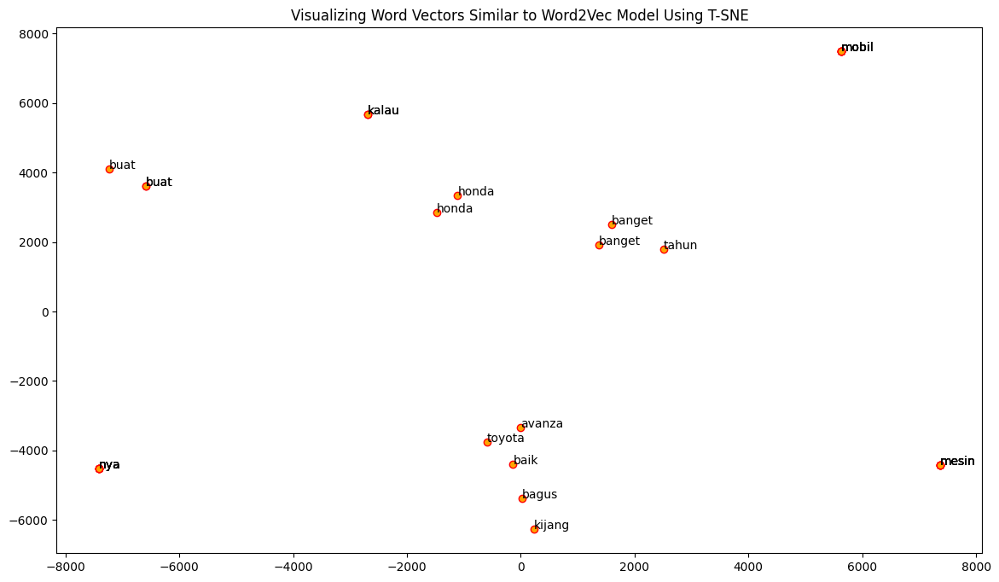

In [ ]:
from sklearn.manifold import TSNE

words = sum([[k] + v for k, v in similar_words.items()], [])
wvs = w2v_model.wv[words]

tsne = TSNE(n_components=2, random_state=0, n_iter=10000, perplexity=2)
np.set_printoptions(suppress=True)
T = tsne.fit_transform(wvs)
labels = words

plt.figure(figsize=(14, 8))
plt.title("Visualizing Word Vectors Similar to Word2Vec Model Using T-SNE")
plt.scatter(T[:, 0], T[:, 1], c="orange", edgecolors="r")
for label, x, y in zip(labels, T[:, 0], T[:, 1]):
    plt.annotate(label, xy=(x + 1, y + 1), xytext=(0, 0), textcoords="offset points")


In [ ]:
w2v_model.wv["avanza"]


array([ 0.03356035,  0.0049075 ,  0.00687899,  0.01809273, -0.00789717,
       -0.00503475,  0.0048545 ,  0.01453076, -0.00728686,  0.00636631,
        0.01241752,  0.00035294,  0.00317136,  0.002607  ,  0.02606963,
       -0.0037613 , -0.01091298, -0.00344895,  0.01199091, -0.03866822,
        0.01286723, -0.01525291,  0.00750016, -0.00258784,  0.0140588 ,
       -0.01584157,  0.00952896, -0.0058962 , -0.04967185,  0.01294986,
        0.01363113, -0.01465555, -0.01273323, -0.014733  ,  0.01650342,
       -0.01145459,  0.01248393,  0.00300157, -0.01156434, -0.02916335,
       -0.01879089,  0.00266082, -0.02443993,  0.02749591, -0.00206447,
        0.00013221, -0.01890794,  0.01973227, -0.01642463,  0.01304292,
        0.00182455, -0.00012903, -0.00271556, -0.01204469,  0.00056513,
        0.00125636,  0.01188514, -0.00762576, -0.01454663, -0.0036815 ,
       -0.01436889, -0.00149267, -0.01627566,  0.00698953, -0.00877705,
        0.0166801 ,  0.00296671,  0.02951001,  0.00733973, -0.00

<h1>Glove Word Embeddings</h1>

In [ ]:
from gensim.models.fasttext import FastText

wpt = nltk.WordPunctTokenizer()
tokenized_corpus = [wpt.tokenize(document) for document in df["clean_sentence"]]

feature_size = 100  
window_context = 50  
min_word_count = 5  
sample = 1e-3 


ft_model = FastText(
    sentences=tokenized_corpus, 
    vector_size=feature_size,  
    window=window_context, 
    min_count=min_word_count, 
    sample=sample,  
    epochs=50,  
)

In [ ]:
similar_words = {
    search_term: [item[0] for item in ft_model.wv.most_similar([search_term], topn=5)]
    for search_term in [
    "avanza",
    "mobil",
    "toyota",
    "bagus",
    "kijang",
    
    ]
}
similar_words


{'avanza': ['luas', 'bandel', 'juara', 'medan', 'suara'],
 'mobil': ['mobilio', 'l', 'lihat', 'juara', 'medan'],
 'toyota': ['tak', 'jadi', 'selalu', 'bukan', 'semua'],
 'bagus': ['injeksi', 'scoopy', 'jangan', 'car', 'banyak'],
 'kijang': ['mungkin', 'ragu', 'indonesia', 'design', 'agya']}

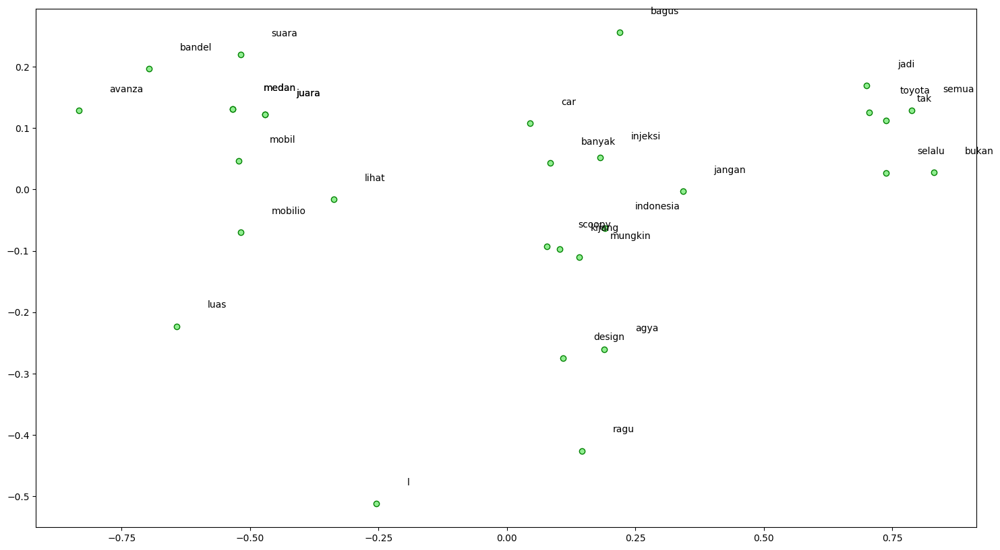

In [ ]:
from sklearn.decomposition import PCA

words = sum([[k] + v for k, v in similar_words.items()], [])
wvs = ft_model.wv[words]

pca = PCA(n_components=2)
np.set_printoptions(suppress=True)
P = pca.fit_transform(wvs)
labels = words

plt.figure(figsize=(18, 10))
plt.scatter(P[:, 0], P[:, 1], c="lightgreen", edgecolors="g")
for label, x, y in zip(labels, P[:, 0], P[:, 1]):
    plt.annotate(
        label, xy=(x + 0.06, y + 0.03), xytext=(0, 0), textcoords="offset points"
    )


In [ ]:
ft_model.wv["avanza"]

array([-0.39392817,  0.24854194, -0.01551719,  0.20146433,  0.26367638,
       -0.07926855,  0.3221037 ,  0.00365699,  0.12366781,  0.16220012,
       -0.19429012, -0.15638903, -0.23631983,  0.05583814, -0.40469345,
       -0.01578834,  0.4101594 , -0.19062746, -0.17897938, -0.2840222 ,
       -0.32683575, -0.23815988, -0.27386716,  0.206881  , -0.29064736,
       -0.19445942, -0.01222885,  0.13193619, -0.20370507,  0.17362404,
       -0.18835361,  0.04185789,  0.1017974 , -0.30326962, -0.02927337,
       -0.0551233 ,  0.1262207 ,  0.06190176, -0.2166762 , -0.00842004,
        0.10831791,  0.01778125, -0.00443886,  0.06643415,  0.05002654,
        0.13462117, -0.35592198, -0.20898953, -0.28562108, -0.10895962,
       -0.17405508,  0.20462117, -0.22129242,  0.1486646 , -0.03063452,
       -0.03978238,  0.19090524, -0.00118451,  0.05579604,  0.21020202,
        0.28681365, -0.05541211, -0.34381887,  0.03240572, -0.16096495,
        0.11835593,  0.18189038,  0.2670325 ,  0.14989977,  0.36

In [ ]:
print(ft_model.wv.similarity(w1="avanza", w2="toyota"))
print(ft_model.wv.similarity(w1="kijang", w2="toyota"))


0.7174916
0.91928595


In [ ]:
st1 = "kijang avanza spacy"
st2 = "mobil toyota sangat bagus"
st3 = "mobil avanza sangat murah"

print("kata berbeda[", st1, "]:", ft_model.wv.doesnt_match(st1.split()))

kata berbeda[ kijang avanza spacy ]: avanza
